In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import matplotlib.pyplot as plt

In [ ]:
fmnist=tf.keras.datasets.fashion_mnist
(X_train,y_train) , (X_test,y_test)=fmnist.load_data()

4431872/4422102 [==============================] - 0s 0us/step


In [ ]:
# printing the shapes

print("X_train shape: ",X_train.shape)
print("y_train shape: ",y_train.shape)
print("X_test shape: ",X_test.shape)
print("y_test shape: ",y_test.shape)

X_train shape:  (60000, 28, 28)
y_train shape:  (60000,)
X_test shape:  (10000, 28, 28)
y_test shape:  (10000,)


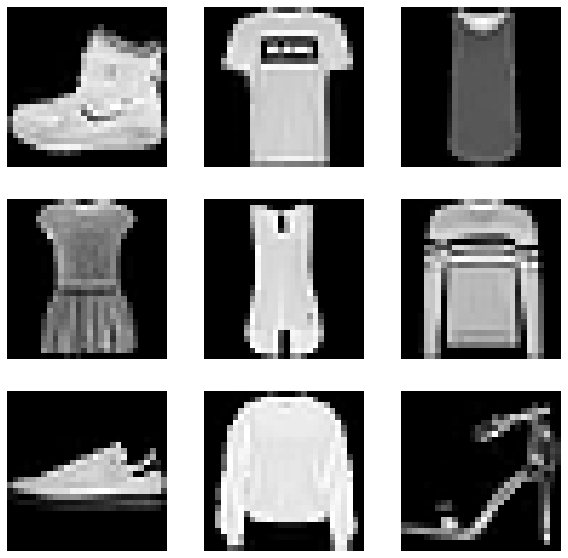

In [ ]:
# display first 9 images of dataset
'''
fig=plt.figure(figsize=(10,10))
fig.add_subplot(121)
plt.imshow(X_train[3],cmap=plt.get_cmap('gray'))
fig.add_subplot(122)
plt.imshow(X_train[5],cmap=plt.get_cmap('gray'))
plt.show()
'''
fig=plt.figure(figsize=(10,10))
nrows=3
ncols=3
for i in range(9):
  fig.add_subplot(nrows,ncols,i+1)
  #plt.imshow(X_train[i])
  plt.imshow(X_train[i],cmap=plt.get_cmap('gray'))
  #plt.title("Images :{}".format(X_train[i]))
  plt.axis(False)
plt.show()


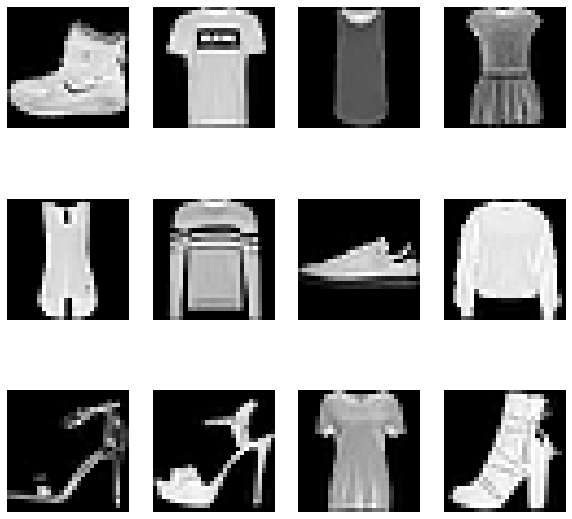

In [ ]:
# images starting from 11 to 22 with 4 imgs in each row

fig=plt.figure(figsize=(10,10))
nrows=3
ncols=4
for i in range(12):
  fig.add_subplot(nrows,ncols,i+1)
  #plt.imshow(X_train[i])
  plt.imshow(X_train[i],cmap=plt.get_cmap('gray'))
  #plt.title("Images :{}".format(X_train[i]))
  plt.axis(False)
plt.show()


In [ ]:
X_train=X_train.reshape([60000,28,28,1])
X_train=X_train.astype('float32')/255.0
print(X_train.shape)
X_test=X_test.reshape([10000,28,28,1])
X_test=X_test.astype('float32')/255.0
print(X_test.shape)
model=keras.Sequential()
model.add(layers.Conv2D(32,(3,3),activation='relu',input_shape=[28,28,1]))
model.add(layers.MaxPooling2D((2,2)))
model.add(layers.Conv2D(64,(3,3),activation='relu'))
model.add(layers.MaxPooling2D((2,2)))
model.add(layers.Flatten())
model.add(layers.Dense(512,activation='relu'))
model.add(layers.Dense(10,activation='softmax'))
model.summary()

(60000, 28, 28, 1)
(10000, 28, 28, 1)
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 26, 26, 32)        320       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 13, 13, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 11, 11, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 5, 5, 64)         0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 1600)              0         
                                                                 
 dense (Dense)    

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import matplotlib.pyplot as plt
y_train = tf.keras.utils.to_categorical(y_train)
y_test = tf.keras.utils.to_categorical(y_test)
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.fit(X_train,y_train,epochs=2) # try for 4

Epoch 1/2
1875/1875 [==============================] - 71s 37ms/step - loss: 0.4269 - accuracy: 0.8441
Epoch 2/2
1875/1875 [==============================] - 69s 37ms/step - loss: 0.2843 - accuracy: 0.8936


In [ ]:
# evaluate model
values = model.evaluate(X_test, y_test)  #verbose=0
print(values)
_, acc = model.evaluate(X_test, y_test)  #verbose=0  # ignore other values take only accuracy
print('> %.3f' % (acc * 100.0))

313/313 [==============================] - 4s 10ms/step - loss: 0.2802 - accuracy: 0.8982
[0.2802145779132843, 0.8981999754905701]
313/313 [==============================] - 3s 10ms/step - loss: 0.2802 - accuracy: 0.8982
> 89.820


In [ ]:
probability_model = tf.keras.Sequential([model, tf.keras.layers.Softmax()])
predictions = probability_model.predict(X_test)


In [ ]:
predictions[0]

array([0.08536605, 0.08536558, 0.0853656 , 0.08536556, 0.08536556,
       0.08545984, 0.08536565, 0.08546708, 0.08536583, 0.23151323],
      dtype=float32)

In [ ]:
import numpy as np
np.argmax(predictions[0])

9

In [ ]:
y_test[0]

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 1.], dtype=float32)

In [ ]:
# tell whether 99th img is correctly predicted
predictions[98]

array([0.08697035, 0.08630043, 0.21654582, 0.08635116, 0.0893995 ,
       0.08627447, 0.08639065, 0.08627644, 0.08921079, 0.0862804 ],
      dtype=float32)

In [ ]:
import numpy as np
np.argmax(predictions[98])

2

In [ ]:
y_test[98]

array([0., 0., 0., 0., 1., 0., 0., 0., 0., 0.], dtype=float32)

In [ ]:
predictions[449]

array([0.08533903, 0.08533838, 0.08533858, 0.08533838, 0.08533839,
       0.23194367, 0.08533848, 0.08534569, 0.08533986, 0.08533954],
      dtype=float32)

In [ ]:
import numpy as np
np.argmax(predictions[449])

5

In [ ]:
y_test[449]

array([0., 0., 0., 0., 0., 1., 0., 0., 0., 0.], dtype=float32)

In [ ]:
predictions[124]

array([0.0869868 , 0.08555142, 0.08556709, 0.22854662, 0.08555633,
       0.08555067, 0.08558065, 0.08555064, 0.08555914, 0.08555066],
      dtype=float32)

In [ ]:
import numpy as np
np.argmax(predictions[124])

3

In [ ]:
y_test[124]

array([0., 0., 0., 1., 0., 0., 0., 0., 0., 0.], dtype=float32)

In [ ]:
!pwd

/content


In [ ]:
ls /   # show all dir

bin/      dev/   lib32/  opt/         run/   tensorflow-1.15.2/  var/
boot/     etc/   lib64/  proc/        sbin/  tmp/
content/  home/  media/  python-apt/  srv/   tools/
datalab/  lib/   mnt/    root/        sys/   usr/


**Creating root directory necessary for kaggle linkage**

In [ ]:
mkdir /root/.kaggle

**Uploading the kaggle.json file, generated by creating new API token on kaggle**

In [ ]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"simrangonsalves","key":"f05fa360206ebbd27aadde7ce7b3829d"}'}

In [ ]:
ls

kaggle.json  sample_data/


**Providing access to read and write the kaggle.json file**

In [ ]:
!chmod 600 kaggle.json

In [ ]:
pwd

'/content'

**Moving json file to root dir created**

In [ ]:
mv kaggle.json /root/.kaggle/

In [ ]:
ls /root/.kaggle/

kaggle.json


In [ ]:
pwd

'/content'

**Copying API command from kaggle to download dataset**

In [ ]:
! kaggle datasets download -d tongpython/cat-and-dog

 99% 215M/218M [00:01<00:00, 152MB/s]
100% 218M/218M [00:01<00:00, 145MB/s]


In [ ]:
ls

cat-and-dog.zip  sample_data/


**Creating proper directory structure**

In [ ]:
!mkdir /proj

mkdir: cannot create directory ‘/proj’: File exists


In [ ]:
!mkdir /proj/catdog

mkdir: cannot create directory ‘/proj/catdog’: File exists


In [ ]:
!mkdir /proj/catdog/train

In [ ]:
!mkdir /proj/catdog/test

In [ ]:
! unzip cat-and-dog.zip -d /proj/catdog/train

Streaming output truncated to the last 5000 lines.
  inflating: /proj/catdog/train/training_set/training_set/cats/cat.3704.jpg  
  inflating: /proj/catdog/train/training_set/training_set/cats/cat.3705.jpg  
  inflating: /proj/catdog/train/training_set/training_set/cats/cat.3706.jpg  
  inflating: /proj/catdog/train/training_set/training_set/cats/cat.3707.jpg  
  inflating: /proj/catdog/train/training_set/training_set/cats/cat.3708.jpg  
  inflating: /proj/catdog/train/training_set/training_set/cats/cat.3709.jpg  
  inflating: /proj/catdog/train/training_set/training_set/cats/cat.371.jpg  
  inflating: /proj/catdog/train/training_set/training_set/cats/cat.3710.jpg  
  inflating: /proj/catdog/train/training_set/training_set/cats/cat.3711.jpg  
  inflating: /proj/catdog/train/training_set/training_set/cats/cat.3712.jpg  
  inflating: /proj/catdog/train/training_set/training_set/cats/cat.3713.jpg  
  inflating: /proj/catdog/train/training_set/training_set/cats/cat.3714.jpg  
  inflating: /

**Copying the cats and dogs file to train folder**

In [ ]:
cp /proj/catdog/train/training_set/training_set/cats/*.jpg /proj/catdog/train/

In [ ]:
cp /proj/catdog/train/training_set/training_set/dogs/*.jpg /proj/catdog/train/

In [ ]:
ls /proj/catdog/train/

 cat.1000.jpg   cat.2803.jpg   dog.1004.jpg       dog.2806.jpg
 cat.1001.jpg   cat.2804.jpg   dog.1005.jpg       dog.2807.jpg
 cat.1002.jpg   cat.2805.jpg   dog.1006.jpg       dog.2808.jpg
 cat.1003.jpg   cat.2806.jpg   dog.1007.jpg       dog.2809.jpg
 cat.1004.jpg   cat.2807.jpg   dog.1008.jpg       dog.280.jpg
 cat.1005.jpg   cat.2808.jpg   dog.1009.jpg       dog.2810.jpg
 cat.1006.jpg   cat.2809.jpg   dog.100.jpg        dog.2811.jpg
 cat.1007.jpg   cat.280.jpg    dog.1010.jpg       dog.2812.jpg
 cat.1008.jpg   cat.2810.jpg   dog.1011.jpg       dog.2813.jpg
 cat.1009.jpg   cat.2811.jpg   dog.1012.jpg       dog.2814.jpg
 cat.100.jpg    cat.2812.jpg   dog.1013.jpg       dog.2815.jpg
 cat.1010.jpg   cat.2813.jpg   dog.1014.jpg       dog.2816.jpg
 cat.1011.jpg   cat.2814.jpg   dog.1015.jpg       dog.2817.jpg
 cat.1012.jpg   cat.2815.jpg   dog.1016.jpg       dog.2818.jpg
 cat.1013.jpg   cat.2816.jpg   dog.1017.jpg       dog.2819.jpg
 cat.1014.jpg   cat.2817.jpg   dog.1018.jpg       dog.28

**Uploading the 50 shared files and moving them into the test folder**

In [ ]:
from google.colab import files
files.upload()

Saving cat.323.jpg to cat.323.jpg
Saving cat.324.jpg to cat.324.jpg
Saving cat.325.jpg to cat.325.jpg
Saving cat.326.jpg to cat.326.jpg
Saving cat.327.jpg to cat.327.jpg
Saving cat.328.jpg to cat.328.jpg
Saving cat.329.jpg to cat.329.jpg
Saving cat.330.jpg to cat.330.jpg
Saving cat.331.jpg to cat.331.jpg
Saving cat.332.jpg to cat.332.jpg
Saving cat.333.jpg to cat.333.jpg
Saving cat.334.jpg to cat.334.jpg
Saving cat.335.jpg to cat.335.jpg
Saving cat.336.jpg to cat.336.jpg
Saving cat.337.jpg to cat.337.jpg
Saving cat.338.jpg to cat.338.jpg
Saving cat.339.jpg to cat.339.jpg
Saving cat.340.jpg to cat.340.jpg
Saving cat.341.jpg to cat.341.jpg
Saving cat.342.jpg to cat.342.jpg
Saving cat.343.jpg to cat.343.jpg
Saving cat.344.jpg to cat.344.jpg
Saving cat.345.jpg to cat.345.jpg
Saving cat.346.jpg to cat.346.jpg
Saving cat.347.jpg to cat.347.jpg
Saving cat.348.jpg to cat.348.jpg
Saving cat.349.jpg to cat.349.jpg
Saving cat.350.jpg to cat.350.jpg
Saving cat.999.jpg to cat.999.jpg
Saving dog.1.j

{'cat.323.jpg': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01\x80\x01\xf3\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca\xd2\xd3\xd4\xd5\xd6\xd

In [ ]:
pwd

'/content'

In [ ]:
ls

cat.323.jpg  cat.334.jpg  cat.345.jpg      dog.13.jpg  dog.23.jpg
cat.324.jpg  cat.335.jpg  cat.346.jpg      dog.14.jpg  dog.24.jpg
cat.325.jpg  cat.336.jpg  cat.347.jpg      dog.15.jpg  dog.25.jpg
cat.326.jpg  cat.337.jpg  cat.348.jpg      dog.16.jpg  dog.26.jpg
cat.327.jpg  cat.338.jpg  cat.349.jpg      dog.17.jpg  dog.27.jpg
cat.328.jpg  cat.339.jpg  cat.350.jpg      dog.18.jpg  dog.2.jpg
cat.329.jpg  cat.340.jpg  cat.999.jpg      dog.19.jpg  dog.3.jpg
cat.330.jpg  cat.341.jpg  cat-and-dog.zip  dog.1.jpg   sample_data/
cat.331.jpg  cat.342.jpg  dog.10.jpg       dog.20.jpg
cat.332.jpg  cat.343.jpg  dog.11.jpg       dog.21.jpg
cat.333.jpg  cat.344.jpg  dog.12.jpg       dog.22.jpg


In [ ]:
mv *.jpg /proj/catdog/test/

In [ ]:
ls /

bin/      dev/   lib32/  opt/         root/  sys/                usr/
boot/     etc/   lib64/  proc/        run/   tensorflow-1.15.2/  var/
content/  home/  media/  proj/        sbin/  tmp/
datalab/  lib/   mnt/    python-apt/  srv/   tools/


In [ ]:
import os
os.chdir('/proj')

In [ ]:
pwd

'/proj'

**Creating train_fnames variable to store all the file names from train dir**

In [ ]:
train_dir = '/proj/catdog/train/'

In [ ]:
train_dir

'/proj/catdog/train/'

In [ ]:
import os
train_fnames = os.listdir(train_dir)

In [ ]:
train_fnames

['dog.2693.jpg',
 'cat.2658.jpg',
 'dog.908.jpg',
 'dog.1322.jpg',
 'cat.3234.jpg',
 'dog.2171.jpg',
 'cat.419.jpg',
 'dog.3087.jpg',
 'cat.3149.jpg',
 'cat.3459.jpg',
 'cat.1462.jpg',
 'dog.1225.jpg',
 'dog.3521.jpg',
 'dog.1600.jpg',
 'dog.1841.jpg',
 'dog.1048.jpg',
 'cat.3649.jpg',
 'dog.3609.jpg',
 'dog.176.jpg',
 'dog.2739.jpg',
 'dog.2430.jpg',
 'cat.565.jpg',
 'cat.3495.jpg',
 'cat.2248.jpg',
 'dog.3088.jpg',
 'cat.993.jpg',
 'cat.3196.jpg',
 'cat.1284.jpg',
 'dog.677.jpg',
 'cat.1338.jpg',
 'dog.3317.jpg',
 'dog.640.jpg',
 'cat.1698.jpg',
 'cat.592.jpg',
 'cat.3756.jpg',
 'cat.2461.jpg',
 'cat.245.jpg',
 'cat.2900.jpg',
 'cat.2545.jpg',
 'cat.2966.jpg',
 'cat.1997.jpg',
 'cat.4.jpg',
 'dog.3284.jpg',
 'dog.2188.jpg',
 'cat.3816.jpg',
 'dog.2047.jpg',
 'dog.3874.jpg',
 'dog.3939.jpg',
 'cat.3386.jpg',
 'cat.1007.jpg',
 'dog.3396.jpg',
 'dog.3767.jpg',
 'cat.3374.jpg',
 'cat.1118.jpg',
 'cat.1459.jpg',
 'dog.1305.jpg',
 'dog.4000.jpg',
 'dog.1701.jpg',
 'dog.350.jpg',
 'dog.1559

**Changing dir to where images are stored, else error will come**

In [ ]:
import os
os.chdir('/proj/catdog/train')

In [ ]:
pwd

'/proj/catdog/train'

**Displaying 12 images from the training data**

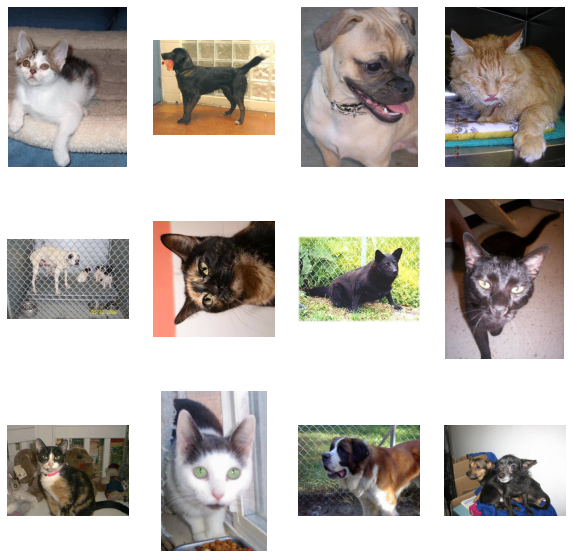

In [ ]:
##display the images from dataset starting with 4 images each row
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(10,10))
nrows=3
ncols=4
for i in range(12):
  fig.add_subplot(nrows, ncols, i+1)
  img = mpimg.imread(train_fnames[i+1])
  plt.imshow(img)
  plt.axis(False)
plt.show()

**Creating test_fnames to store filenames of test images**

In [ ]:
test_dir = '/proj/catdog/test/'

In [ ]:
test_dir

'/proj/catdog/test/'

In [ ]:
import os
test_fnames = os.listdir(test_dir)

In [ ]:
test_fnames

['cat.347.jpg',
 'dog.20.jpg',
 'cat.330.jpg',
 'cat.331.jpg',
 'dog.16.jpg',
 'cat.339.jpg',
 'dog.23.jpg',
 'dog.21.jpg',
 'cat.348.jpg',
 'cat.338.jpg',
 'dog.19.jpg',
 'cat.999.jpg',
 'dog.17.jpg',
 'cat.343.jpg',
 'cat.350.jpg',
 'dog.12.jpg',
 'dog.27.jpg',
 'cat.334.jpg',
 'dog.13.jpg',
 'cat.340.jpg',
 'dog.15.jpg',
 'dog.11.jpg',
 'cat.345.jpg',
 'dog.22.jpg',
 'cat.335.jpg',
 'cat.328.jpg',
 'cat.346.jpg',
 'dog.10.jpg',
 'cat.324.jpg',
 'dog.1.jpg',
 'cat.332.jpg',
 'dog.26.jpg',
 'dog.24.jpg',
 'cat.327.jpg',
 'cat.323.jpg',
 'cat.349.jpg',
 'dog.18.jpg',
 'cat.333.jpg',
 'dog.14.jpg',
 'cat.341.jpg',
 'cat.329.jpg',
 'dog.2.jpg',
 'dog.25.jpg',
 'cat.337.jpg',
 'dog.3.jpg',
 'cat.336.jpg',
 'cat.344.jpg',
 'cat.342.jpg',
 'cat.326.jpg',
 'cat.325.jpg']

In [ ]:
import os
os.chdir('/proj/catdog/test')

In [ ]:
pwd

'/proj/catdog/test'

**display the images from test data**

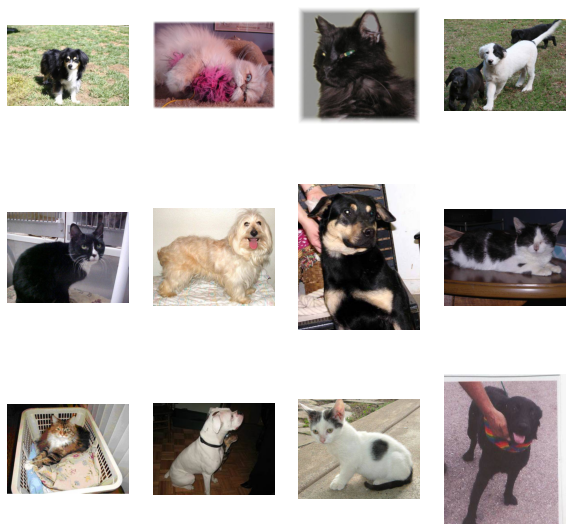

In [ ]:
##display the images from dataset starting with 4 images each row
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(10,10))
nrows=3
ncols=4
for i in range(12):
  fig.add_subplot(nrows, ncols, i+1)
  img = mpimg.imread(test_fnames[i+1])
  plt.imshow(img)
  plt.axis(False)
plt.show()

**Categorizing cat and dog**

In [ ]:
Image_Width=150
Image_Height=150
Image_Size=(Image_Width,Image_Height)
Image_Channels=3

import pandas as pd
import os
filenames=os.listdir("/proj/catdog/train")
categories=[]
for f_name in filenames:
    category=f_name.split('.')[0]      #  dog.2752.jpg-->  dog   2752   jpg
    if category=='dog':
        categories.append(1)
    else:
        categories.append(0)
df=pd.DataFrame({
    'filename':filenames,
    'category':categories
})

In [ ]:
df

,filename,category
0,dog.2693.jpg,1
1,cat.2658.jpg,0
2,dog.908.jpg,1
3,dog.1322.jpg,1
4,cat.3234.jpg,0
...,...,...
8002,cat.325.jpg,0
8003,cat.2185.jpg,0
8004,cat.2309.jpg,0
8005,cat.413.jpg,0


**CNN model**

In [ ]:
Image_Width=150
Image_Height=150
Image_Size=(Image_Width,Image_Height)
Image_Channels=3

from keras.models import Sequential
from keras.layers import Conv2D,MaxPooling2D,\
     Dropout,Flatten,Dense,Activation,\
     BatchNormalization

model=Sequential()
model.add(Conv2D(32,(3,3),activation='relu',input_shape=(Image_Width,Image_Height,Image_Channels)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.25))

model.add(Conv2D(64,(3,3),activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.25))

model.add(Conv2D(128,(3,3),activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.25))
model.add(Flatten())

model.add(Dense(512,activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.5))
model.add(Dense(2,activation='softmax'))
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 148, 148, 32)      896       
_________________________________________________________________
batch_normalization (BatchNo (None, 148, 148, 32)      128       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 74, 74, 32)        0         
_________________________________________________________________
dropout (Dropout)            (None, 74, 74, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 72, 72, 64)        18496     
_________________________________________________________________
batch_normalization_1 (Batch (None, 72, 72, 64)        256       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 36, 36, 64)        0

In [ ]:
# compiling
model.compile(loss='categorical_crossentropy',     # binary_crossentropy
              optimizer='adam',                    #rmsprop
              metrics=['accuracy'])

**Creating multiple images (augmentation) using ImageDataGenerator** (9th aug)

In [ ]:
import os
os.chdir('/proj/catdog/train')

**Displaying single image**

'cat.2658.jpg'

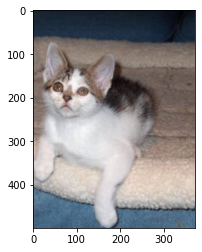

In [ ]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
img = mpimg.imread(train_fnames[1])
plt.imshow(img)
train_fnames[1]

In [ ]:
pwd

'/proj/catdog/train'

In [ ]:
!mkdir '/proj/catdog/train/augment'

In [ ]:
!mkdir '/proj/catdog/train/temp'

In [ ]:
from keras.preprocessing.image import ImageDataGenerator
from keras.preprocessing.image import img_to_array, load_img
import numpy as np

In [ ]:
# define input dir path and output dir path where generated img will be store
src_path = '/proj/catdog/train/cat.2658.jpg'
des_path = '/proj/catdog/train/augment/'    # test

**Loading input image to convert to numpy**

In [ ]:
# loading input img
image = load_img(src_path)
image = img_to_array(image)   # to convert to numpy
image = np.expand_dims(image, axis=0)  # to expand 1D nos to 2D nos

**Defining ImageDataGenerator class**

In [ ]:
aug = ImageDataGenerator(
    rotation_range=30,
    zoom_range=0.15,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.15,
    horizontal_flip=True,
    fill_mode="nearest"
)

**Applying ImageDataGenerator to input single image**

In [ ]:
# apply ImageDataGenerator to input image single
imageGen = aug.flow(image, batch_size=1, save_to_dir=des_path, save_prefix="cat",save_format="jpg")

In [ ]:
! ls /proj/catdog/train/augment   # will not work

In [ ]:
# define no of augmented image which you want to download and iterate through loop
total_image = 15
i = 0
for e in imageGen:
  if (i == total_image):
    break
  i=i+1

In [ ]:
! ls * /proj/catdog/train/augment/*

 cat.1000.jpg   cat.3408.jpg	   dog.2213.jpg
 cat.1001.jpg   cat.3409.jpg	   dog.2214.jpg
 cat.1002.jpg   cat.340.jpg	   dog.2215.jpg
 cat.1003.jpg   cat.3410.jpg	   dog.2216.jpg
 cat.1004.jpg   cat.3411.jpg	   dog.2217.jpg
 cat.1005.jpg   cat.3412.jpg	   dog.2218.jpg
 cat.1006.jpg   cat.3413.jpg	   dog.2219.jpg
 cat.1007.jpg   cat.3414.jpg	   dog.221.jpg
 cat.1008.jpg   cat.3415.jpg	   dog.2220.jpg
 cat.1009.jpg   cat.3416.jpg	   dog.2221.jpg
 cat.100.jpg    cat.3417.jpg	   dog.2222.jpg
 cat.1010.jpg   cat.3418.jpg	   dog.2223.jpg
 cat.1011.jpg   cat.3419.jpg	   dog.2224.jpg
 cat.1012.jpg   cat.341.jpg	   dog.2225.jpg
 cat.1013.jpg   cat.3420.jpg	   dog.2226.jpg
 cat.1014.jpg   cat.3421.jpg	   dog.2227.jpg
 cat.1015.jpg   cat.3422.jpg	   dog.2228.jpg
 cat.1016.jpg   cat.3423.jpg	   dog.2229.jpg
 cat.1017.jpg   cat.3424.jpg	   dog.222.jpg
 cat.1018.jpg   cat.3425.jpg	   dog.2230.jpg
 cat.1019.jpg   cat.3426.jpg	   dog.2231.jpg
 cat.101.jpg    cat.3427.jpg	   dog.2232.jpg
 cat.1020.jpg 

In [ ]:
import os
files=[]
files = [f for f in sorted(os.listdir('/proj/catdog/train/augment/'))]

In [ ]:
files

['cat_0_1340.jpg',
 'cat_0_2017.jpg',
 'cat_0_2514.jpg',
 'cat_0_451.jpg',
 'cat_0_4835.jpg',
 'cat_0_5323.jpg',
 'cat_0_5843.jpg',
 'cat_0_6393.jpg',
 'cat_0_7071.jpg',
 'cat_0_7092.jpg',
 'cat_0_7490.jpg',
 'cat_0_8360.jpg',
 'cat_0_8396.jpg',
 'cat_0_8398.jpg',
 'cat_0_9057.jpg',
 'cat_0_9497.jpg']

In [ ]:
import os
os.chdir('/proj/catdog/train/augment/')

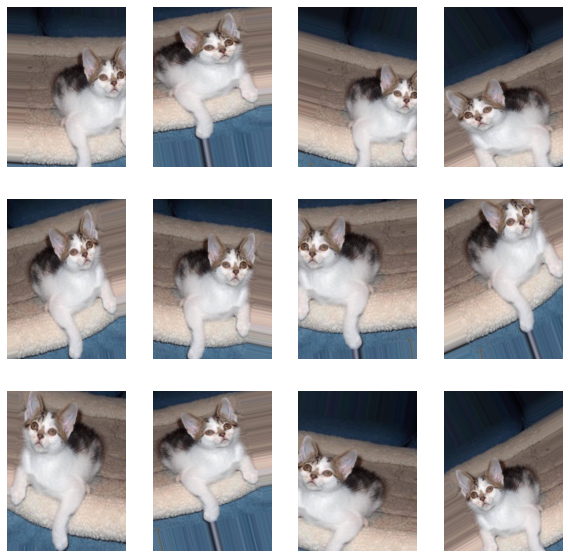

In [ ]:
##display the images from dataset starting with 4 images each row
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(10,10))
nrows=3
ncols=4
for i in range(12):
  fig.add_subplot(nrows, ncols, i+1)
  img = mpimg.imread(files[i])
  plt.imshow(img)
  plt.axis(False)
plt.show()



---



# **EXTRA**

In [ ]:
import os
os.chdir('/proj/catdog/test')

**Copying imgs to test folder**

In [ ]:
! mkdir /proj/catdog/test

mkdir: cannot create directory ‘/proj/catdog/test’: File exists


In [ ]:
import os

In [ ]:
os.chdir('/proj/catdog/test')

In [ ]:
from google.colab import files
files.upload()

Saving cat.323.jpg to cat.323 (1).jpg
Saving cat.324.jpg to cat.324 (1).jpg
Saving cat.325.jpg to cat.325 (1).jpg
Saving cat.326.jpg to cat.326 (1).jpg
Saving cat.327.jpg to cat.327 (1).jpg
Saving cat.328.jpg to cat.328 (1).jpg
Saving cat.329.jpg to cat.329 (1).jpg
Saving cat.330.jpg to cat.330 (1).jpg
Saving cat.331.jpg to cat.331 (1).jpg
Saving cat.332.jpg to cat.332 (1).jpg
Saving cat.333.jpg to cat.333 (1).jpg
Saving cat.334.jpg to cat.334 (1).jpg
Saving cat.335.jpg to cat.335 (1).jpg
Saving cat.336.jpg to cat.336 (1).jpg
Saving cat.337.jpg to cat.337 (1).jpg
Saving cat.338.jpg to cat.338 (1).jpg
Saving cat.339.jpg to cat.339 (1).jpg
Saving cat.340.jpg to cat.340 (1).jpg
Saving cat.341.jpg to cat.341 (1).jpg
Saving cat.342.jpg to cat.342 (1).jpg
Saving cat.343.jpg to cat.343 (1).jpg
Saving cat.344.jpg to cat.344 (1).jpg
Saving cat.345.jpg to cat.345 (1).jpg
Saving cat.346.jpg to cat.346 (1).jpg
Saving cat.347.jpg to cat.347 (1).jpg
Saving cat.348.jpg to cat.348 (1).jpg
Saving cat.3

{'cat.323.jpg': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01\x80\x01\xf3\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca\xd2\xd3\xd4\xd5\xd6\xd



---



---



**CNN model**

In [ ]:
Image_Width=150
Image_Height=150
Image_Size=(Image_Width,Image_Height)
Image_Channels=3

from keras.models import Sequential
from keras.layers import Conv2D,MaxPooling2D,\
     Dropout,Flatten,Dense,Activation,\
     BatchNormalization

model=Sequential()
model.add(Conv2D(32,(3,3),activation='relu',input_shape=(Image_Width,Image_Height,Image_Channels)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.25))

model.add(Conv2D(64,(3,3),activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.25))

model.add(Conv2D(128,(3,3),activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.25))
model.add(Flatten())
model.add(Dense(512,activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.5))
model.add(Dense(2,activation='softmax'))
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_3 (Conv2D)            (None, 148, 148, 32)      896       
_________________________________________________________________
batch_normalization_4 (Batch (None, 148, 148, 32)      128       
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 74, 74, 32)        0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 74, 74, 32)        0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 72, 72, 64)        18496     
_________________________________________________________________
batch_normalization_5 (Batch (None, 72, 72, 64)        256       
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 36, 36, 64)       

In [ ]:
# compiling
model.compile(loss='binary_crossentropy',       # categorical_crossentropy
              optimizer='adam',                 #rmsprop
              metrics=['accuracy'])

# **Dataframe**

In [ ]:
Image_Width=150
Image_Height=150
Image_Size=(Image_Width,Image_Height)
Image_Channels=3

import pandas as pd
import os
filenames=os.listdir("/proj/catdog/train")
categories=[]
for f_name in filenames:
    category=f_name.split('.')[0]      #  dog.2752.jpg-->  dog   2752   jpg
    if category=='dog':                # = assigning == comparing
        categories.append(1)
    else:
        categories.append(0)
df=pd.DataFrame({
    'filename':filenames,
    'category':categories
})

In [ ]:
df

,filename,category
0,dog.2693.jpg,1
1,cat.2658.jpg,0
2,dog.908.jpg,1
3,dog.1322.jpg,1
4,cat.3234.jpg,0
...,...,...
8004,cat.325.jpg,0
8005,cat.2185.jpg,0
8006,cat.2309.jpg,0
8007,cat.413.jpg,0


**Dividing into Training and Validation**

In [ ]:
from sklearn.model_selection import train_test_split

df["category"] = df["category"].replace({0:'cat',1:'dog'})
train_df,validate_df = train_test_split(df,test_size=0.20,     # validate- dividing training data into train and test(validate)
  random_state=42)

train_df = train_df.reset_index(drop=True)
validate_df = validate_df.reset_index(drop=True)

total_train=train_df.shape[0]
total_validate=validate_df.shape[0]
batch_size=15

In [ ]:
from keras.preprocessing.image import ImageDataGenerator
train_datagen = ImageDataGenerator(rotation_range=15,
                                rescale=1./255,
                                shear_range=0.1,
                                zoom_range=0.2,
                                horizontal_flip=True,
                                width_shift_range=0.1,
                                height_shift_range=0.1
                                )
train_generator = train_datagen.flow_from_dataframe(train_df,
                                                 "/proj/catdog/train/",x_col='filename',y_col='category',
                                                 target_size=Image_Size,
                                                 class_mode='categorical',
                                                 batch_size=batch_size)
validation_datagen = ImageDataGenerator(rescale=1./255)
validation_generator = validation_datagen.flow_from_dataframe(
    validate_df,
    "/proj/catdog/train/",
    x_col='filename',
    y_col='category',
    target_size=Image_Size,
    class_mode='categorical',
    batch_size=batch_size
)

Found 6403 validated image filenames belonging to 2 classes.
Found 1602 validated image filenames belonging to 2 classes.


/usr/local/lib/python3.7/dist-packages/keras_preprocessing/image/dataframe_iterator.py:282: UserWarning: Found 4 invalid image filename(s) in x_col="filename". These filename(s) will be ignored.
  .format(n_invalid, x_col)


In [ ]:
test_datagen = ImageDataGenerator(rescale=1./255)                                           # not working
# point to parent of test class as first parameter
test_generator = validation_datagen.flow_from_directory("/proj/catdog/test/")

# it fails becoz flow from dir searches only subfolder and we dont have subfolder inside test

Found 0 images belonging to 0 classes.


In [ ]:
test_datagen = ImageDataGenerator(rescale=1./255)                                           # works
# point to parent of test class as first parameter
test_generator = test_datagen.flow_from_directory('/proj/catdog/', classes=['test'])

Found 50 images belonging to 1 classes.


**Training the model**

In [ ]:
# dont run this code

from keras.callbacks import EarlyStopping, ReduceLROnPlateau
earlystop = EarlyStopping(patience=10)
learning_rate_reduction = ReduceLROnPlateau(monitor='val_acc',patience=2, verbose=1, factor=0.5, min_lr=0.00001)
callbacks=[earlystop,learning_rate_reduction]

In [ ]:
epochs=10
history = model.fit_generator(
    train_generator,
    epochs=epochs,
    validation_data=validation_generator,
    validation_steps=total_validate//batch_size,
    steps_per_epoch=total_train//batch_size,
    # callbacks=callbacks
)

/usr/local/lib/python3.7/dist-packages/keras/engine/training.py:1972: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/10
427/427 [==============================] - 498s 1s/step - loss: 0.8197 - accuracy: 0.5969 - val_loss: 0.7495 - val_accuracy: 0.5434
Epoch 2/10
427/427 [==============================] - 501s 1s/step - loss: 0.6744 - accuracy: 0.6413 - val_loss: 0.6524 - val_accuracy: 0.6340
Epoch 3/10
427/427 [==============================] - 497s 1s/step - loss: 0.6054 - accuracy: 0.6833 - val_loss: 0.6044 - val_accuracy: 0.6755
Epoch 4/10
427/427 [==============================] - 497s 1s/step - loss: 0.6045 - accuracy: 0.6859 - val_loss: 0.6777 - val_accuracy: 0.6333
Epoch 5/10
427/427 [==============================] - 504s 1s/step - loss: 0.5837 - accuracy: 0.6895 - val_loss: 0.5781 - val_accuracy: 0.6975
Epoch 6/10
427/427 [==============================] - 499s 1s/step - loss: 0.5533 - accuracy: 0.7183 - val_loss: 0.5535 - val_accuracy: 0.7220
Epoch 7/10
427/427 [==============================] - 501s 1s/step - loss: 0.5425 - accuracy: 0.7223 - val_loss: 0.6529 - val_accuracy: 0.6686

**saving the model in gdrive**

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
!ls /content/gdrive/

MyDrive  Shareddrives


**change the drive dir**

In [ ]:
import os
os.chdir('/content/gdrive/MyDrive/')   # if MyDrive not working  then do My Drive

In [ ]:
!ls

'07SITS0702209008 (1).pdf'
 07SITS0702209008.pdf
'209008 (1).pdf'
'209008 (2).pdf'
'209008 (3).pdf'
'209008 Advanced statistical methods Journal.pdf'
'209008 CIA BDA Sem 2.pdf'
'209008 CIA.pdf'
 209008_CLUSTERING.ipynb
 209008_DFS.ipynb
 209008_DS_.ipynb
'209008 ET.pdf'
'209008 - Hadoop Assignment.docx'
 209008.jpeg
 209008.jpg
'209008 LINEAR ALGEBRA PRACTICAL.docx'
'209008 OR.pdf'
 209008.pdf
'209008 poly.pdf'
'209008 Practical.pdf'
'209008 - Simran Gonsalves.docx'
'209008 Simran Gonsalves.docx'
'209008-Simran Gonsalves-e journal.docx'
'209008-Simran Gonsalves-Pandas Project.pdf'
'209008 - Simran Gonsalves.pdf'
 209008-SimranGonsalves-prac1.docx
'209008-SimranGonsalves-prac 2.docx'
'209008-SimranGonsalves-prac 3.docx'
 209008-SimranGonsalves-prac.docx
'209008 SITS0802.pdf'
'209008 SITS0802PR part- 1.pdf'
'209008 star.pdf'
 209008_SVM.ipynb
'Adobe Scan 17 Dec 2020 (1).pdf'
'Adobe Scan 17 Dec 2020 (2).pdf'
'attendance_18th_sep_tyit (1).gdoc'
 attendance_18th_sep_tyit.gdoc
 bio
 Cardio.g

**define path**

In [ ]:
path = F"/content/gdrive/MyDrive/modelcatdog.h5"   # file with extention h5 is available or not
model.save(path)

In [ ]:
!ls *.h5      # having all the files h5

**Load the model**

In [ ]:
from tensorflow.keras.models import load_model
path = F"/content/gdrive/MyDrive/modelcatdog.h5"   # file with extention h5 is available or not
model=load_model(path)
model

In [ ]:
!pwd

/content


In [ ]:
import os
os.chdir('/content/gdrive/MyDrive/images')

**Prediction of single img by loading model**

In [ ]:
result={
    0:'Cat',
    1:'Dog'
}
from PIL import Image
import numpy as np
im = Image.open("/content/gdrive/MyDrive/images/cat.28.jpg")
im_width = 150    # size should always be same
im_height = 150
Image_size = (im_width,im_height)
im = im.resize(Image_size)
im = np.expand_dims(im,axis=0)
im = np.array(im)
im = im/255
predict = model.predict([im])[0]
print(predict)
if predict[0]>predict[1]:
  print('cat')
else:
  print('dog')
result[np.argmax(predict)]

# -----------older version------------
# see in rec 21 aug
#-------------------------------------

# result will be array of 1*2 dimension
# [0][0] -- cat
# [0][1] -- dog

# some images may be predicted wrong becoz accuracy is less
# to increase accuracy epoch value should be high

# write rms prop instead of adam
# increase epoch to 15
# then the model will give better result

# test this code with all images and see how many imgs match

# if dog img --- right side > left side value and vice versa for cat img

[0.96684945 0.03315057]
cat


'Cat'

In [ ]:
result={
    0:'Cat',
    1:'Dog'
}
from PIL import Image
import numpy as np
im = Image.open("/content/gdrive/MyDrive/images/cat.3.jpg")
im_width = 150    # size should always be same
im_height = 150
Image_size = (im_width,im_height)
im = im.resize(Image_size)
im = np.expand_dims(im,axis=0)
im = np.array(im)
im = im/255
predict = model.predict([im])[0]
print(predict)
if predict[0]>predict[1]:
  print('cat')
else:
  print('dog')
result[np.argmax(predict)]

[0.3229756 0.6770244]
dog


'Dog'

In [ ]:
result={
    0:'Cat',
    1:'Dog'
}
from PIL import Image
import numpy as np
im = Image.open("/content/gdrive/MyDrive/images/cat.18.jpg")
im_width = 150    # size should always be same
im_height = 150
Image_size = (im_width,im_height)
im = im.resize(Image_size)
im = np.expand_dims(im,axis=0)
im = np.array(im)
im = im/255
predict = model.predict([im])[0]
print(predict)
if predict[0]>predict[1]:
  print('cat')
else:
  print('dog')
result[np.argmax(predict)]

[0.5026933  0.49730667]
cat


'Cat'

In [ ]:
result={
    0:'Cat',
    1:'Dog'
}
from PIL import Image
import numpy as np
im = Image.open("/content/gdrive/MyDrive/images/dog.31.jpg")
im_width = 150    # size should always be same
im_height = 150
Image_size = (im_width,im_height)
im = im.resize(Image_size)
im = np.expand_dims(im,axis=0)
im = np.array(im)
im = im/255
predict = model.predict([im])[0]
print(predict)
if predict[0]>predict[1]:
  print('cat')
else:
  print('dog')
result[np.argmax(predict)]

[0.3786756  0.62132436]
dog


'Dog'

In [ ]:
result={
    0:'Cat',
    1:'Dog'
}
from PIL import Image
import numpy as np
im = Image.open("/content/gdrive/MyDrive/images/dog.102.jpg")
im_width = 150    # size should always be same
im_height = 150
Image_size = (im_width,im_height)
im = im.resize(Image_size)
im = np.expand_dims(im,axis=0)
im = np.array(im)
im = im/255
predict = model.predict([im])[0]
print(predict)
if predict[0]>predict[1]:
  print('cat')
else:
  print('dog')
result[np.argmax(predict)]

[0.00159192 0.99840814]
dog


'Dog'

In [ ]:
result={
    0:'Cat',
    1:'Dog'
}
from PIL import Image
import numpy as np
im = Image.open("/content/gdrive/MyDrive/images/dog.104.jpg")
im_width = 150    # size should always be same
im_height = 150
Image_size = (im_width,im_height)
im = im.resize(Image_size)
im = np.expand_dims(im,axis=0)
im = np.array(im)
im = im/255
predict = model.predict([im])[0]
print(predict)
if predict[0]>predict[1]:
  print('cat')
else:
  print('dog')
result[np.argmax(predict)]

[0.0254898 0.9745102]
dog


'Dog'

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
from tensorflow.keras.models import load_model
path=F"/content/gdrive/MyDrive/modelcatdog.h5"
model=load_model(path)
model

In [ ]:
!pwd

/content


**CNN Model Architecture**

In [ ]:
import numpy as np
import tensorflow as tf
from keras.preprocessing import image
from keras.applications.imagenet_utils import preprocess_input, decode_predictions
from keras.models import Sequential
from keras.layers import Conv2D,MaxPooling2D,Dropout,Flatten,Dense,Activation,BatchNormalization
from keras.layers import Input

model=tf.keras.applications.mobilenet_v2.MobileNetV2(include_top=False,
                                                     input_shape=(128,128,3),
                                                     pooling='avg',weights='imagenet')
model.summary()

9420800/9406464 [==============================] - 0s 0us/step
Model: "mobilenetv2_1.00_128"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
Conv1 (Conv2D)                  (None, 64, 64, 32)   864         input_1[0][0]                    
__________________________________________________________________________________________________
bn_Conv1 (BatchNormalization)   (None, 64, 64, 32)   128         Conv1[0][0]                      
__________________________________________________________________________________________________
Conv1_relu (ReLU)               (None, 64, 64, 32)   0           bn_Conv1[0][0]                   
________________

In [ ]:
model1=tf.keras.applications.nasnet.NASNetMobile(include_top=False,
                                                 input_shape=(224,224,3),
                                                 pooling='avg',weights='imagenet')
model1.summary()

20004864/19993432 [==============================] - 0s 0us/step
Model: "NASNet"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
stem_conv1 (Conv2D)             (None, 111, 111, 32) 864         input_2[0][0]                    
__________________________________________________________________________________________________
stem_bn1 (BatchNormalization)   (None, 111, 111, 32) 128         stem_conv1[0][0]                 
__________________________________________________________________________________________________
activation (Activation)         (None, 111, 111, 32) 0           stem_bn1[0][0]                   
____________________________

In [ ]:
model2=tf.keras.applications.densenet.DenseNet201(include_top=False,
                                                  input_shape=(224,224,3),
                                                  pooling='avg',weights='imagenet')
model2.summary()

74850304/74836368 [==============================] - 1s 0us/step
Model: "densenet201"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
zero_padding2d_4 (ZeroPadding2D (None, 230, 230, 3)  0           input_3[0][0]                    
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, 112, 112, 64) 9408        zero_padding2d_4[0][0]           
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1/conv[0][0]                 
_______________________

In [ ]:
model3=tf.keras.applications.resnet_v2.ResNet101V2(include_top=False,
                                                   input_shape=(224,224,3),
                                                   pooling='avg',weights='imagenet')
model3.summary()

171327488/171317808 [==============================] - 2s 0us/step
Model: "resnet101v2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_4[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
pool1_pad (ZeroPadding2D)       (None, 114, 114, 64) 0           conv1_conv[0][0]                 
_____________________

In [ ]:
model4=tf.keras.applications.efficientnet.EfficientNetB0(include_top=False,
                                                         input_shape=(224,224,3),
                                                         pooling='avg',weights='imagenet')
model4.summary()

16719872/16705208 [==============================] - 0s 0us/step
Model: "efficientnetb0"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
rescaling (Rescaling)           (None, 224, 224, 3)  0           input_5[0][0]                    
__________________________________________________________________________________________________
normalization (Normalization)   (None, 224, 224, 3)  7           rescaling[0][0]                  
__________________________________________________________________________________________________
stem_conv_pad (ZeroPadding2D)   (None, 225, 225, 3)  0           normalization[0][0]              
____________________

**GAN**

**Discriminator**

In [ ]:
#########load libraries
import numpy as np
import pandas as pd
import keras
from keras.layers import Conv2D, Conv2DTranspose, Dropout, Input, Flatten, LeakyReLU, Dense, Reshape
from keras.models import Model, Sequential
from keras.datasets import mnist
from keras.layers.advanced_activations import LeakyReLU


# load the images into memory
from keras.utils.vis_utils import plot_model
from numpy import vstack, ones
from numpy.random.mtrand import rand, randint, randn
import pandas as pd
import keras
from keras.layers import Conv2D, Conv2DTranspose, Dropout, Input, Flatten, LeakyReLU, Dense, Reshape
from keras.models import Model, Sequential
from keras.datasets import mnist
from keras.layers.advanced_activations import LeakyReLU


# load the images into memory
from keras.utils.vis_utils import plot_model
from numpy import vstack, ones
from numpy.random.mtrand import rand, randint, randn

(trainX,trainy), (testX,testy) = mnist.load_data()
# summarize shape of the data
print('Train', trainX.shape,trainy.shape)
print('Test', testX.shape,testy.shape)

11501568/11490434 [==============================] - 0s 0us/step
Train (60000, 28, 28) (60000,)
Test (10000, 28, 28) (10000,)


In [ ]:
def define_discriminator(in_shape=(28, 28, 1)):

  model = Sequential()
  model.add(Conv2D(64, (3, 3), strides=(2, 2), padding='same', input_shape=in_shape))
  model.add(LeakyReLU(alpha=0.2))
  model.add(Dropout(0.4))
  model.add(Conv2D(64, (3, 3), strides=(2, 2), padding='same'))
  model.add(LeakyReLU(alpha=0.2))
  model.add(Dropout(0.4))
  model.add(Flatten())
  #model.add(Dense(256, activation='sigmoid'))
  model.add(Dense(1, activation='sigmoid'))
  # compile model

  model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
  return model
d_model=define_discriminator()

In [ ]:
##### load actual images
def load_real_samples():
    # expand to 3d, e.g. add channels dimension
    X = np.expand_dims(trainX, axis=-1)
    # convert from unsigned ints to floats
    X = X.astype('float32')
    # scale from [0,255] to [0,1]
    X = X / 255.0
    return X
########
def generate_real_samples(dataset, n_samples):
    # choose random instances
    ix = randint(0, dataset.shape[0], n_samples)
    # retrieve selected images
    X = dataset[ix]
    # generate 'real' class labels (1)
    y = np.ones((n_samples, 1))
    return X, y


##########
def generate_fake_samples(n_samples):
    # generate uniform random numbers in [0,1]
    X = rand(28 * 28 * n_samples)
    # reshape into a batch of grayscale images
    X = X.reshape((n_samples, 28, 28, 1))
    # generate 'fake' class labels (0)
    y = np.zeros((n_samples, 1))
    return X, y

In [ ]:
# train the discriminator model
def train_discriminator(model,dataset,n_iter=100,n_batch=256):
  half_batch=int(n_batch/2)
  # manually enumerate epoch
  for i in range(n_iter):
    # get randomly selected 'real' samples
    X_real,y_real=generate_real_samples(dataset,half_batch)
    # update discriminator on real samples
    _,real_acc=model.train_on_batch(X_real,y_real)
    # generate 'fake' examples
    X_fake,y_fake=generate_fake_samples(half_batch)
    # update discriminator on fake samples
    _,fake_acc=model.train_on_batch(X_fake,y_fake)
    # summarize performance
    print('>%d real=%.0f%% fake=%.0f%%'%(i+1,real_acc*100,fake_acc*100))

# define the discriminator model
model=define_discriminator()
# summarize the model
model.summary()
# plot the model
plot_model(model,to_file='discriminator_plot.png',show_shapes=True,show_layer_names=True)
# load image data
dataset=load_real_samples()
# fit the model
train_discriminator(model,dataset)

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_6 (Conv2D)            (None, 14, 14, 64)        640       
_________________________________________________________________
leaky_re_lu_6 (LeakyReLU)    (None, 14, 14, 64)        0         
_________________________________________________________________
dropout_6 (Dropout)          (None, 14, 14, 64)        0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 7, 7, 64)          36928     
_________________________________________________________________
leaky_re_lu_7 (LeakyReLU)    (None, 7, 7, 64)          0         
_________________________________________________________________
dropout_7 (Dropout)          (None, 7, 7, 64)          0         
_________________________________________________________________
flatten_3 (Flatten)          (None, 3136)             

**Generator**

In [ ]:
# define the generator model
def define_generator(latent_dim):
    model = Sequential()
    n_nodes = 128 * 7 * 7
    model.add(Dense(n_nodes, input_dim=latent_dim))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Reshape((7, 7, 128)))
    # upsample to 14x14
    model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    # upsample to 28x28
    model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Conv2D(1, (7, 7), activation='sigmoid', padding='same'))
    return model
g_model=define_generator(100)

# define the size of the latent space
latent_dim = 100
# define the generator model
model = define_generator(latent_dim)
# summarise the model
model.summary()
# plot the model
plot_model(model, to_file='generator_plot.png', show_shapes=True, show_layer_names=True)

########## latent space
# generate points in latent space as input for the generator
def generate_latent_points(latent_dim, n_samples):
    # generate points in the latent space
    x_input = randn(latent_dim * n_samples)
    # reshape into a batch of inputs for the network
    x_input = x_input.reshape(n_samples, latent_dim)
    return x_input
############
def generate_fake_samples(g_model, latent_dim, n_samples):
    # generate points in latent space
    x_input = generate_latent_points(latent_dim, n_samples)
    # predict outputs
    X = g_model.predict(x_input)
    # create 'fake' class labels (0) since the images generated are obviously fake
    y = np.zeros((n_samples, 1))
    return X, y
#########  def gan
def define_gan(g_model, d_model):
    # make weights in the discriminator not trainable
    d_model.trainable = False
    model = Sequential()
    # add generator
    model.add(g_model)
    # add the discriminator
    model.add(d_model)
    # compile model
    #opt = Adam(lr=0.0002, beta_1=0.5)
    model.compile(loss='binary_crossentropy', optimizer='adam')
    return model

gan_model = define_gan(g_model, d_model)
# summarize gan model
gan_model.summary()
# plot gan model
plot_model(gan_model, to_file='gan_plot.png', show_shapes=True, show_layer_names=True)
#### train
def train(g_model, d_model, gan_model, dataset, latent_dim, n_epochs=100, n_batch=256):
    bat_per_epo = int(dataset.shape[0] / n_batch)
    half_batch = int(n_batch / 2)
    # manually enumerate epochs
    for i in range(n_epochs):
        # enumerate batches over the training set
        for j in range(bat_per_epo):
            # get randomly selected 'real' samples
            X_real, y_real = generate_real_samples(dataset, half_batch)
            # generate 'fake' examples


            X, y = vstack((X_real, X_fake)), vstack((y_real, y_fake))
            # update discriminator model weights
            d_loss, _ = d_model.train_on_batch(X, y)
            # prepare points in latent space as input for the generator
            X_gan = generate_latent_points(latent_dim, n_batch)
            # create inverted labels for the fake samples
            y_gan = ones((n_batch, 1))
            # update the generator via the discriminator's error

            g_loss = gan_model.train_on_batch(X_gan, y_gan)
            # summarize loss on this batch
            print('>%d, %d/%d, d=%.3f, g=%.3f' % (i + 1, j + 1, bat_per_epo, d_loss, g_loss))

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_5 (Dense)              (None, 6272)              633472    
_________________________________________________________________
leaky_re_lu_11 (LeakyReLU)   (None, 6272)              0         
_________________________________________________________________
reshape_1 (Reshape)          (None, 7, 7, 128)         0         
_________________________________________________________________
conv2d_transpose_2 (Conv2DTr (None, 14, 14, 128)       262272    
_________________________________________________________________
leaky_re_lu_12 (LeakyReLU)   (None, 14, 14, 128)       0         
_________________________________________________________________
conv2d_transpose_3 (Conv2DTr (None, 28, 28, 128)       262272    
_________________________________________________________________
leaky_re_lu_13 (LeakyReLU)   (None, 28, 28, 128)      